# **Proyecto Final - Introducción a los Sistemas Inteligentes**

* Nicolás Martinez López
* Gabriel Santiago Delgado Lozano
* Cesar Arthuro Lemos Silva

# **Bibliotecas y Demás Funciones Utilizadas**

In [1]:
%pip install pillow numpy pandas matplotlib seaborn torch tensorflow
%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Looking in indexes: https://download.pytorch.org/whl/cu126
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import os
import gc
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random
import csv
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as modelst
import pandas as pd
import warnings

Función para Ver una Imagen

In [3]:
def index_imagen(X, y, nombres, index, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
        ax.set_title(f'y={y[index]} Imagen: {nombres[index]}')
    else:
        ax.set_title(f'y={y[index]} Región {nombres[index].split("_")[1]}')
    ax.imshow(X[index].reshape((512, 512, 3)), cmap='gray')
    
    ax.axis('off')
    if ax is None:
        plt.show()

In [4]:
def buscar_indices(arreglo, parametro):
    return [i for i, x in enumerate(arreglo) if parametro in x]

Función Para Ver las Imágenes de Un Paciente

In [6]:
def imagenes_paciente(X, y, nombres, paciente):
    indices = buscar_indices(nombres, paciente)
    num_imagenes = len(indices)
    
    # Calcular el número de filas y columnas
    num_filas = min(5, num_imagenes)  # Máximo 3 filas
    num_columnas = (num_imagenes + num_filas - 1) // num_filas  # Redondear hacia arriba
    
    # Crear la figura y los subgráficos
    
    fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 15))
    
    fig.suptitle(f'Paciente: {paciente}', fontsize=20)
    
    # Aplanar los ejes si hay más de una fila
    if num_filas > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    
    for i, index in enumerate(indices):
        index_imagen(X, y, nombres, index, axes[i])
    
    # Ocultar los ejes vacíos
    for j in range(i + 1, num_filas * num_columnas):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

In [7]:
def grafico_densidad(y0, y1, titley0, titley1):
    mediay0 = np.mean(y0)
    mediay1 = np.mean(y1)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Gráfico de densidad para las etiquetas de entrenamiento
    sns.kdeplot(pd.Series(y0), fill=True, color='blue', ax=axes[0])
    axes[0].axvline(mediay0, color='red', linestyle='--', label=f'Media: {mediay0:.2f}')
    axes[0].set_title(titley0)
    axes[0].set_xlabel('Etiqueta')
    axes[0].set_ylabel('Densidad')
    axes[0].legend()

    # Gráfico de densidad para las etiquetas de validación
    sns.kdeplot(pd.Series(y1), fill=True, color='blue', ax=axes[1])
    axes[1].axvline(mediay1, color='red', linestyle='--', label=f'Media: {mediay1:.2f}')
    axes[1].set_title(titley1)
    axes[1].set_xlabel('Etiqueta')
    axes[1].set_ylabel('Densidad')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

Función Para Generar El Archivo de Envío

In [8]:
def generar_archivo(nombres_imagenes, y_pred, nombre_archivo):
    if not os.path.exists('Submissions'):
        os.makedirs('Submissions')
        
    rutaarchivo = os.path.join('Submissions', nombre_archivo)
    with open(rutaarchivo, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['slide', 'rid', 'score'])
        for nombre, y in zip(nombres_imagenes, y_pred):
            slide, rid = nombre.split('_')
            writer.writerow([slide, rid, y])

# **Descripción del Problema**

## *Términos Técnicos*

**Cáncer de Mama**

Definición: El cáncer de mama es una enfermedad en la que células de la mama alteradas se multiplican sin control y forman tumores que, de no tratarse, pueden propagarse por todo el cuerpo y causar la muerte.

Extraído de: https://www.who.int/es/news-room/fact-sheets/detail/breast-cancer

**Tratamiento Neoadjuvante**

Definición: Tratamiento que se administra como primer paso para reducir el tamaño del tumor antes del tratamiento principal que generalmente consiste en cirugía. Entre los ejemplos de terapia adyuvante están la quimioterapia, la radioterapia y la terapia hormonal. Es un tipo de terapia de inducción.

Extraído de: https://www.cancer.gov/espanol/publicaciones/diccionarios/diccionario-cancer/def/terapia-neoadyuvante

**Patología**

Definición: rama fundamental de la Medicina que se ocupa del estudio de las enfermedades. Su objetivo principal es entender las causas (etiología), los mecanismos de desarrollo (patogenia), los cambios estructurales en los tejidos y órganos del cuerpo (alteraciones morfológicas) y los efectos de estas enfermedades (manifestaciones clínicas). Como disciplina médica, la patología actúa como un puente entre la ciencia básica y la medicina clínica, proporcionando la base para el diagnóstico y tratamiento de las enfermedades.

Extraído de: https://www.cun.es/diccionario-medico/terminos/patologia

**Celularidad**

Definición: Composición celular de un tejido orgánico, ya desde el punto de vista de su cantidad, ya desde el de su calidad

Extraído de: https://dem.colmex.mx/ver/celularidad


**Imágenes de Diapositivas Completas - WSI - Whole Slide Images**

Definición: La imagen de diapositiva completa es la manipulación de imágenes digitales de secciones de tejido que se han escaneado con diferentes aumentos. Esto permite al espectador acercarse a áreas de interés, simulando así el examen de diapositivas de vidrio bajo un microscopio tradicional.

Extraído de: https://doctorhoogstra.com/wiki/imagenes-de-diapositivas-enteras/#:~:text=La%20imagen%20de%20diapositiva%20completa%20es%20la%20manipulaci%C3%B3n,de%20diapositivas%20de%20vidrio%20bajo%20un%20microscopio%20tradicional.

## *El Problema*

Detectar el cáncer de mama a tiempo es crucial para tratarlo con éxito. Las mamografías son radiografías de las mamas que pueden encontrar cambios anormales antes de que se sientan o causen síntomas. Sin embargo, interpretar estas imágenes puede variar entre médicos, lo que puede afectar el diagnóstico.

La detección del cáncer de mama en sus etapas tempranas es de vital importancia para poder administrar tratamientos neoadjuvantes antes de que los tumores crezcan demasiado. Para esto, los oncologos analizan las imágenes de diapositivas completas para encontrar anomalías en las celulas de mama. Sin embargo, cada médico puede tener una interpretación diferente o un detalle crucial podría ir por encima del radar. Entonces, surge la necesidad de tener métodos que faciliten e incrementen la precisión del diagnóstico.

## *Relación del Machine Learning Con el Problema*

El machine learning es una herramienta que responde a la necesidad de tener un método que logre clasificar las IDC de tejidos de mama. La iniciativa "BreastPathQ: Cancer Cellularity Challenge 2019" fue creada para que la comunidad de machine learning creara y propusiera modelos que lograran clasificar tejidos cancerígenos con mayor precisión y consistencia.

# **Importación de Datos**

Rutas Correspondientes a las Carpetas de las Imágenes de cada Conjunto de Datos

In [9]:
train_folder = './breastpathq/datasets/train'
validation_folder = './breastpathq/datasets/validation'
test_folder = './breastpathq-test/test_patches'

En la importación de datos, simplemente se recorren cada uno de los pacientes e identificadores de los pacientes(que se encuentran en el archivo .csv en el caso de los conjuntos de test y entrenamiento) y se guarda la respectiva imagen en el arreglo convirtiéndola a 1 dimensión. Sabiendo que la imagen correspondiente a un pasiente estará guardada en la respectiva carpeta en el siguiente formato:
*     idpaciente_rid.tif

En el caso del conjunto de datos de entrenamiento simplemente se recorrerá la carpeta con las imágenes y se almacenará en las respectivas variables.

De cada conjunto de Datos se Guardará la siguiente información:

**Train**
*   X_train: Imágenes en 1 dimensión del conjunto de entrenamiento
*   train_nombres_imagenes: Nombres de los Archivos que se almacenan en el conjunto X_train
*   y_train: Labels Correspongientes a Cada una de las Imágenes almacenadas en X_train   

**Validation**
*   X_validation: Imágenes en 1 dimensión del conjunto de validación
*   validation_nombres_imagenes: Nombres de los Archivos que se almacenan en el conjunto X_validation
*   y_validation: Labels Correspongientes a Cada una de las Imágenes almacenadas en X_validation

**Test**
*   X_test: Imágenes en 1 dimensión del conjunto de pruebas
*   test_nombres_imagenes: Nombres de los Archivos que se almacenan en el conjunto X_test


Los arreglos denominados nombres_imagenes se usaran para identificar las imagenes que se almacenan en los conjuntos correspondientes, en el caso de test se usará para poder construir el archivo de envío final.

## *Importación Train*

In [10]:
labels_train = pd.read_csv('./breastpathq/datasets/train_labels.csv')
regiones = []

In [11]:
X_train = []
y_train = []
train_nombres_imagenes = []
for index, row in labels_train.iterrows():
    image = Image.open(os.path.join(train_folder, str(int(row['slide'])) + '_' + str(int(row['rid'])) + '.tif'))
    image = np.array(image)
    #print(image.shape)#3 Dimensiones
    X_train.append(image.flatten())
    #print(len(image.flatten()))#1 Dimensión
    y_train.append(row['y'])
    train_nombres_imagenes.append(str(int(row['slide'])) + '_' + str(int(row['rid'])))
    if str(int(row['rid'])) not in regiones:
        regiones.append(str(int(row['rid'])))

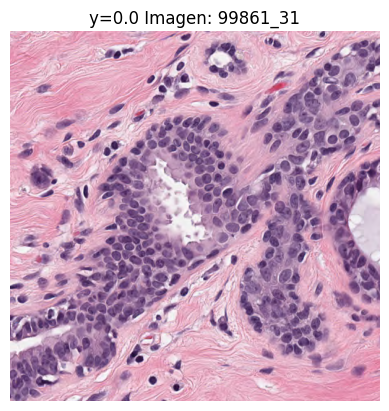

In [12]:
index_imagen(X_train, y_train, train_nombres_imagenes, 30)

## *Importación Validation*

In [13]:
labels_validation = pd.read_csv('./breastpathq-test/val_labels.csv')

In [14]:
X_validation = []
y_validation = []
validation_nombres_imagenes = []
for index, row in labels_validation.iterrows():
    image = Image.open(os.path.join(validation_folder, str(int(row['slide'])) + '_' + str(int(row['rid'])) + '.tif'))
    image = np.array(image)
    X_validation.append(image.flatten())
    y_validation.append(row['y'])
    validation_nombres_imagenes.append(str(int(row['slide'])) + '_' + str(int(row['rid'])))

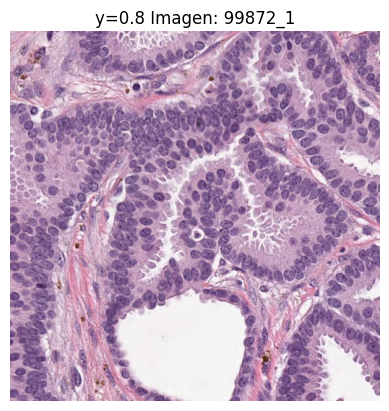

In [15]:
index_imagen(X_validation, y_validation, validation_nombres_imagenes, 30)

## *Importación Test*

In [16]:
X_test = []
test_nombres_imagenes = []
for image_name in os.listdir(test_folder):
    test_nombres_imagenes.append(os.path.splitext(image_name)[0])
    image = Image.open(os.path.join(test_folder, image_name))
    image = np.array(image)#3 Dimensiones
    X_test.append(image.flatten()) #1 Dimensión 

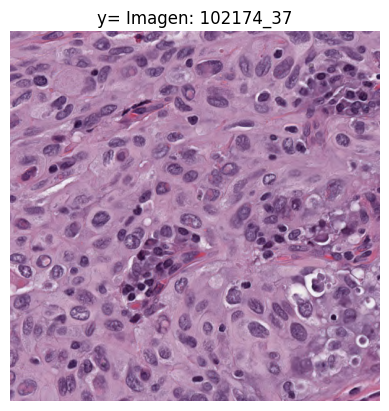

In [17]:
index_imagen(X_test, [""]*len(X_test), test_nombres_imagenes, 30)

# **Exploración de Datos**

## *Distribución de las Etiquetas*

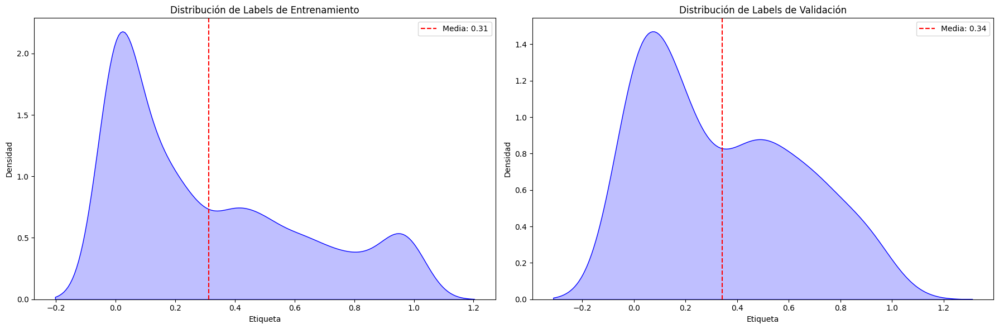

In [18]:
grafico_densidad(y_train, y_validation, 'Distribución de Labels de Entrenamiento', 'Distribución de Labels de Validación')

Distribución de Labels de Entrenamiento:

*   La gráfica representa la densidad de las etiquetas de entrenamiento.
*   Se observa una distribución multimodal con varias regiones de alta densidad.
*   La línea roja punteada indica la media de las etiquetas en el conjunto de entrenamiento (aproximadamente 0.31).

Distribución de Labels de Validación:

*   Muestra la distribución de etiquetas en el conjunto de validación.
*   Tiene una forma similar a la de entrenamiento, lo cual es bueno porque indica que la división de datos fue adecuada.
*   La media de las etiquetas en validación es ligeramente mayor (aproximadamente 0.34), pero no hay una diferencia extrema.

## *Distribución del Promedio de los Pacientes*

In [19]:
pacientes_train = list(set([nombre.split('_')[0] for nombre in train_nombres_imagenes]))
pacientes_validation = list(set([nombre.split('_')[0] for nombre in validation_nombres_imagenes]))

In [20]:
print(f'Número de pacientes en el conjunto de entrenamiento: {len(pacientes_train)}')
print(f'Número de pacientes en el conjunto de validación: {len(pacientes_validation)}')

Número de pacientes en el conjunto de entrenamiento: 63
Número de pacientes en el conjunto de validación: 6


In [21]:
y_mean_pacientes_train = []
y_mean_pacientes_validation = []
for paciente in pacientes_train:
    indices = buscar_indices(train_nombres_imagenes, paciente)
    y_mean_pacientes_train.append(np.mean([y_train[i] for i in indices]))

for paciente in pacientes_validation:
    indices = buscar_indices(validation_nombres_imagenes, paciente)
    y_mean_pacientes_validation.append(np.mean([y_validation[i] for i in indices]))

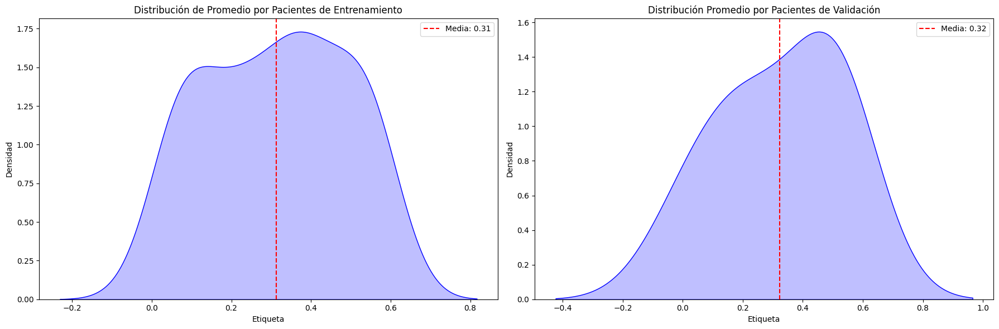

In [22]:
grafico_densidad(y_mean_pacientes_train, y_mean_pacientes_validation, 'Distribución de Promedio por Pacientes de Entrenamiento', 'Distribución Promedio por Pacientes de Validación')

La imagen muestra la distribución de los promedios de las etiquetas de celularidad por paciente, en lugar de la densidad de etiquetas individuales de las imágenes. En el gráfico de la izquierda, se presenta la distribución para los datos de entrenamiento, mientras que en el gráfico de la derecha se muestra la distribución para los datos de validación. Ambas distribuciones tienen una forma similar, con una ligera asimetría hacia la derecha. La línea roja punteada indica la media de cada distribución, la cual es de aproximadamente 0.31 para el conjunto de entrenamiento y 0.32 para el de validación. Esto sugiere que los valores promedio de celularidad por paciente en ambos conjuntos son similares, lo que indica una buena correspondencia entre los datos de entrenamiento y validación.

## *Distribución de los Labels de cada región*

En este caso se analizarán los labels de cada región diferente de los datos en el conjunto de entrenamiento.

In [23]:
labels_region = dict()
regiones.sort()
promediosregion = dict()

In [24]:
for region in regiones:
    labels_region[region] = []
for region in regiones:
    indices_region = buscar_indices(train_nombres_imagenes, "_"+region)
    for index in indices_region:
        labels_region[region].append(y_train[index])

C:\Users\gabs5\AppData\Local\Temp\ipykernel_16212\4125130950.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(pd.Series(labels_region[region]), fill=True, color='blue', ax=axes[int(region)-1])
C:\Users\gabs5\AppData\Local\Temp\ipykernel_16212\4125130950.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(pd.Series(labels_region[region]), fill=True, color='blue', ax=axes[int(region)-1])
C:\Users\gabs5\AppData\Local\Temp\ipykernel_16212\4125130950.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(pd.Series(labels_region[region]), fill=True, color='blue', ax=axes[int(region)-1])
C:\Users\gabs5\AppData\Local\Temp\ipykernel_16212\4125130950.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to

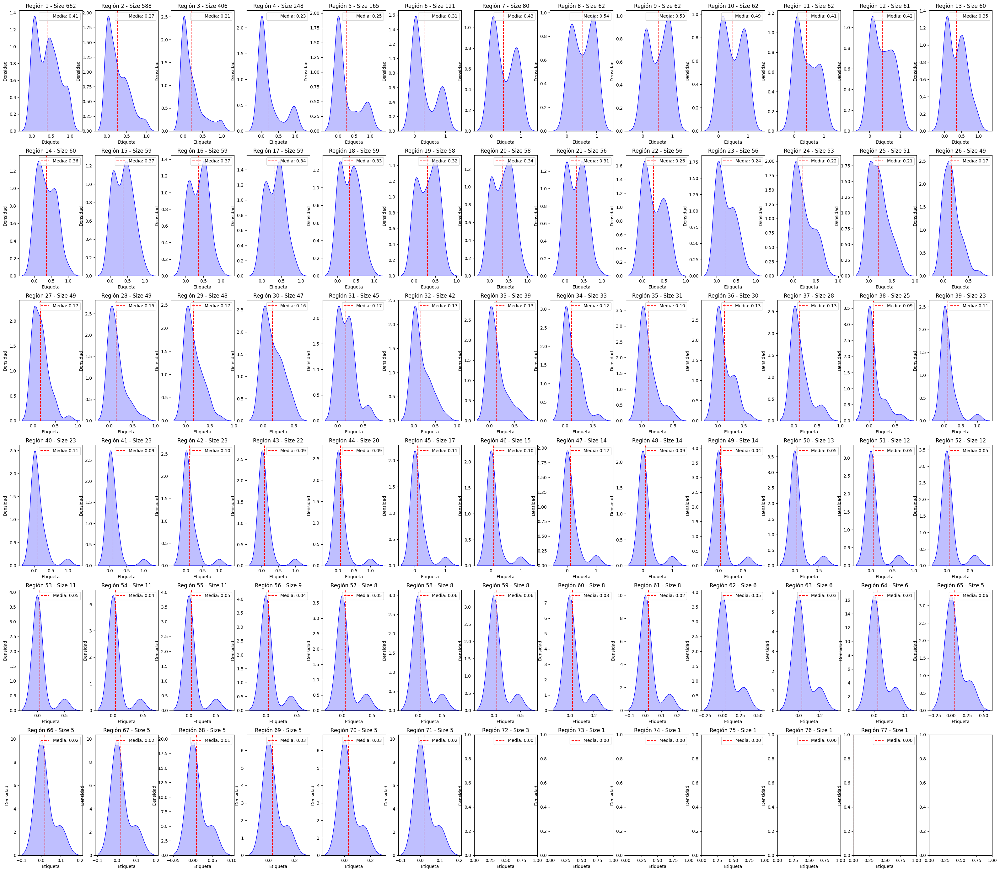

In [25]:
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")
num_filas = 6
num_columnas = (len(regiones)+num_filas-1)// num_filas  # Redondear hacia arriba
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(40, 35))
axes = axes.flatten()
for region in regiones:
    media = np.mean(labels_region[region])
    promediosregion[region] = media
    sns.kdeplot(pd.Series(labels_region[region]), fill=True, color='blue', ax=axes[int(region)-1])
    axes[int(region)-1].axvline(media, color='red', linestyle='--', label=f'Media: {media:.2f}')
    axes[int(region)-1].set_title(f'Región {region} - Size {len(labels_region[region])}')
    axes[int(region)-1].set_xlabel('Etiqueta')
    axes[int(region)-1].set_ylabel('Densidad')
    axes[int(region)-1].legend()

Del gráfico anterior podemos observar como se dispone de pocos datos para una gran cantidad de regiones, se podría decir que desde la región 56 en adelante.

Por otro lado las regiones en su mayoría disponen de su mayor densidad de imágenes con etiquetas menores a 0.5.

Las regiones 49 en adelante tienen un label bastante cercano a 0, puede ser por la poca cantidad de imágenes, pero también es un indicador que no se puede dejar pasar.

Las regiones más bajas son las que tienen una mayor concentración de información, además de que tienen labels mucho más altos en comparación con las regiones superiores. Sin embargo aunque estas regiones tengan una mayor cantidad de información, se puede observar que la mayoría tiene mayor densidad en los labels menores a 0.5, con algunas excepciones.

Se logra identificar claramente que las regiones que presentan una densidad a considerar por su ubicación son:
*   Las regiones 1, y desde la 6 hasta la 25

La mayoría de regiones parece tener una tendencia de densidad de dos montañas, es decir, que los datos presentan una concentración a destacar en dos puntos en el intervalo 0 a 1.

Para las regiones 72 hasta la 77 no se observa gráfico de densidad debido a que solo se cuenta con 1 dato.

**Las Regiones Ordenadas de Mayor a Menor de Acuerdo a su etiqueta son**

In [26]:
#print(promediosregion)
print(dict(sorted(promediosregion.items(), key=lambda item: item[1], reverse=True)))

{'8': 0.5406451612903225, '9': 0.5285483870967741, '10': 0.48661290322580647, '7': 0.425625, '12': 0.41836065573770487, '11': 0.4127419354838709, '1': 0.4052870090634441, '15': 0.37457627118644066, '16': 0.3688135593220339, '14': 0.359, '13': 0.3466666666666667, '20': 0.3448275862068966, '17': 0.3435593220338982, '18': 0.326271186440678, '19': 0.3184482758620689, '21': 0.3076785714285714, '6': 0.30669421487603304, '2': 0.2721938775510204, '22': 0.2625, '5': 0.2516969696969697, '23': 0.23892857142857143, '4': 0.22560483870967743, '24': 0.2164150943396226, '25': 0.21019607843137256, '3': 0.20613300492610837, '26': 0.16938775510204082, '27': 0.1673469387755102, '32': 0.16666666666666666, '31': 0.16555555555555557, '29': 0.165, '30': 0.15531914893617021, '28': 0.15142857142857144, '33': 0.13384615384615386, '36': 0.12833333333333333, '37': 0.12678571428571428, '34': 0.1203030303030303, '47': 0.11785714285714287, '39': 0.11304347826086956, '40': 0.11043478260869563, '45': 0.1088235294117647

## *Análisis de Imágenes*

Se realizará Para 4 Casos diferentes, buscando encontrar de alguna manera alguna diferenciación que permita establecer de una mejor manera el label. Estos 4 Casos Son:
*   **Label Igual a 0**
*   **Label Menor o Igual a 0.4**
*   **Label Mayor o Igual a 0.7**
*   **Label Igual a 1**

En cada Caso se Analizarán 12 Imagenes

In [27]:
numimagenes = 12

### *Análisis de Imágenes Cuya Etiqueta es = 0*

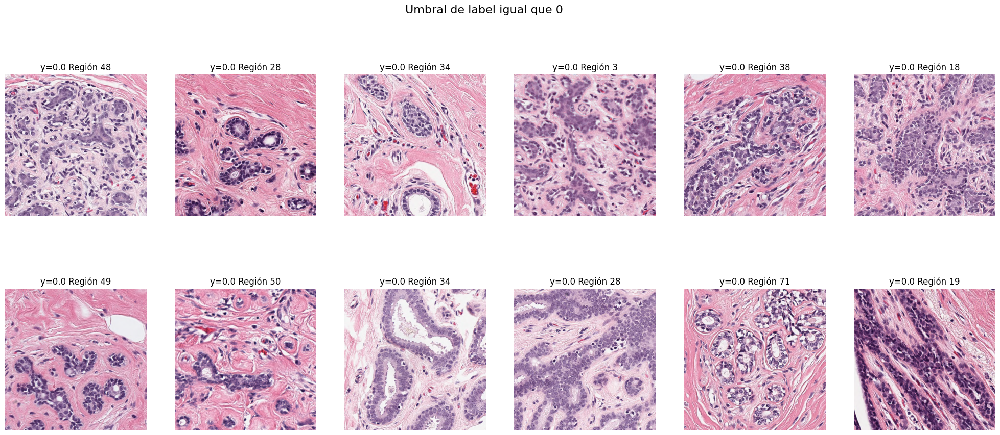

In [28]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0
indices_train = [i for i, y in enumerate(y_train) if y == umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de las Imágenes Cuya Etiqueta es <= 0.4*

Se ha escogido <=0.4 ya que consideramos que este es un valor pequeño con respecto a aquellos que pueden tener un mayor indice, de manera que se pueda identificar algún patrón de las células cancerigenas, a partir de este conjunto de datos se analizará un subconjunto considerable que permita observar de mejor manera el patrón.

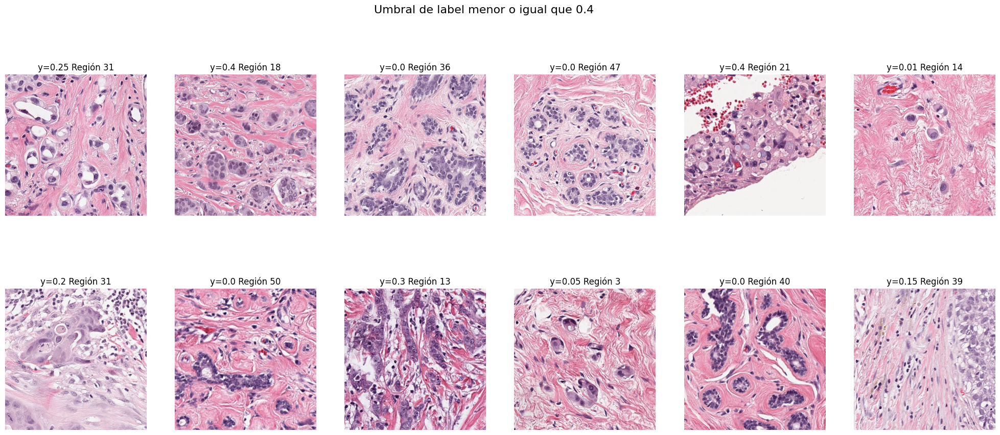

In [29]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0.4
indices_train = [i for i, y in enumerate(y_train) if y <= umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label menor o igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de Imágenes Cuya Etiqueta es >= 0.7*

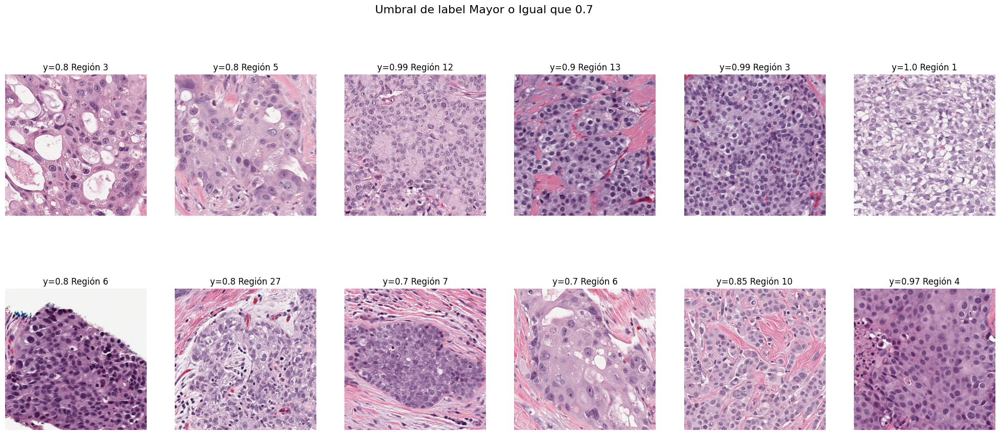

In [30]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0.7
indices_train = [i for i, y in enumerate(y_train) if y >= umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label Mayor o Igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de Imágenes Cuya Etiqueta es = 1.0*

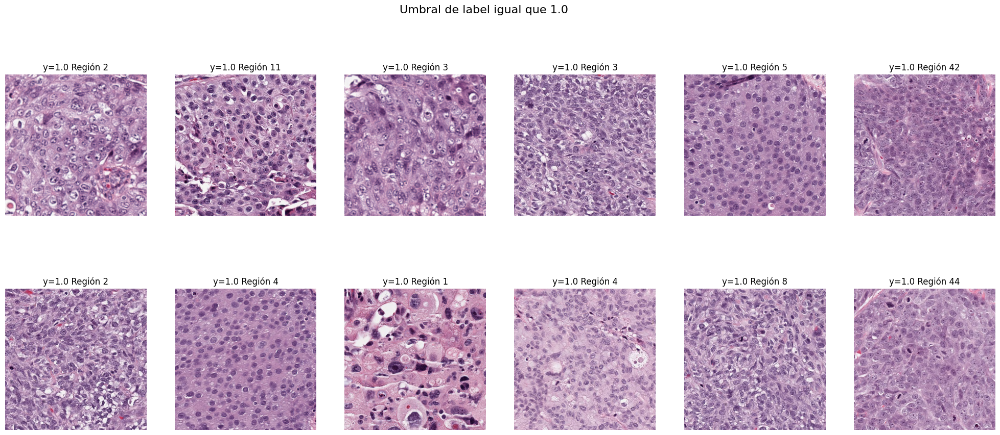

In [31]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 1.0
indices_train = [i for i, y in enumerate(y_train) if y == umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### **Conclusión de la Visualización de Imágenes con diferentes Umbrales**

Análisis de Patrones en Imágenes de Tejido Tumoral  

Tras examinar las imágenes correspondientes a etiquetas altas (y≥0.7) y bajas (y≤0.4) en el dataset BreastPathQ, se pueden identificar diferencias visuales clave que podrían estar relacionadas con la celularidad tumoral.  

En las imágenes con etiquetas altas (y≥0.7), se observa una alta densidad celular, con escaso espacio intercelular. En contraste, en las imágenes con etiquetas bajas (y≤0.4), hay mayor presencia de tejido conectivo y matriz extracelular, con mayor separación entre células, lo que sugiere una menor celularidad tumoral.  

Otra diferencia notable es la organización celular. En las regiones con celularidad alta (y≥0.7), las células aparecen más desorganizadas, sin estructuras glandulares definidas. En cambio, en las imágenes con menor celularidad (y≤0.4), las células tienden a agruparse en estructuras organizadas, como lóbulos o glándulas rodeadas de matriz extracelular.  

También se observa un patrón en la coloración. En imágenes con valores bajos (y≤0.4), hay mayor presencia de material extracelular teñido de rosa, lo que sugiere la presencia de tejido fibroso o estroma. En cambio, en imágenes con valores altos (y≥0.7), predomina el color morado intenso, lo que indica una mayor cantidad de núcleos celulares y, por lo tanto, una mayor celularidad tumoral.  

Estos patrones sugieren que una mayor celularidad tumoral se asocia con una alta densidad de núcleos celulares, menor cantidad de tejido conectivo y una disposición celular desorganizada. Por otro lado, una baja celularidad tumoral se caracteriza por una mayor presencia de tejido conectivo, estructuras glandulares organizadas y una menor cantidad de células tumorales dispersas.  


# **Modelos y Exploración de Hiper-Parámetros**

## Uso de GPU Y Definición del Dataset Personalizado para Usarse en Resnet34 y ResNet50

El siguiente bloque código define un conjunto de datos personalizado para entrenar los modelos de clasificación Resnet. Primero, verifica si hay una GPU disponible y la usa para acelerar el procesamiento. Luego, se implementa una clase que hereda de Dataset, la cual almacena las imágenes en un formato adecuado(espera las imágenes en un formato de 1 dimensión) y permite aplicar transformaciones opcionales. En la función que obtiene los elementos del dataset, se reconstruye cada imagen desde su formato unidimensional a su tamaño original y se convierte a una imagen PIL para facilitar su procesamiento. Además, se almacena la etiqueta correspondiente en un tensor de PyTorch. Esta estructura es fundamental para cargar los datos de manera eficiente durante el entrenamiento del modelo.

In [32]:
# Asegurar que usamos la GPU si está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

class BreastPathQDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images  # Arreglo con imágenes 1D
        self.labels = labels  # Etiquetas de celularidad
        self.transform = transform
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        # Reconstruir la imagen de 1D a 512x512x3
        img = self.images[idx].reshape(512, 512, 3).astype(np.uint8)
        img = Image.fromarray(img)  # Convertir a PIL
        
        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        
        if self.transform:
            img = self.transform(img)
        
        return img, label

Usando dispositivo: cpu


## Función para Transformar las Imágenes Para Usarse en Resnet34 y ResNet50

Se define una serie de transformaciones para preprocesar las imágenes antes de ingresarlas al modelo. Primero, se redimensionan a 224x224 píxeles porque este es el tamaño de entrada esperado por modelos preentrenados como ResNet. Luego, se convierten a tensores para que PyTorch pueda manejarlas eficientemente. Finalmente, se normalizan usando los valores de media y desviación estándar [0.485, 0.456, 0.406] y [0.229, 0.224, 0.225], respectivamente, que corresponden a la normalización utilizada en ImageNet, lo que ayuda a estabilizar el entrenamiento cuando se usan modelos preentrenados en este dataset.


**Nota:** ImageNet es una base de datos masiva de imágenes etiquetadas que se usa para entrenar modelos de visión por computadora. Ha sido clave en el desarrollo de redes como ResNet y VGG, permitiendo el transfer learning en diversas tareas.

In [33]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensionar a 224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

## Cargar los Datos Formato ResNet → Imágenes de Entrenamiento, Validación y Test

Aquí se crean los conjuntos de entrenamiento, validación y prueba a partir de los datos disponibles. Cada conjunto se instancia usando la clase BreastPathQDataset, aplicando las transformaciones definidas previamente. Luego, se cargan en DataLoader para facilitar su manejo en lotes durante el entrenamiento y evaluación.

Entrenamiento: Se usa train_dataset con sus respectivas imágenes y etiquetas (X_train, y_train). El DataLoader tiene shuffle=True para mezclar los datos en cada época y mejorar la generalización.


Validación: Se define val_dataset con X_validation y y_validation. El DataLoader mantiene shuffle=False para evaluar siempre con los mismos datos.


Prueba: test_dataset usa X_test, pero las etiquetas se llenan con ceros (np.zeros(len(X_test))) porque no se usan en la predicción. El DataLoader también tiene shuffle=False para mantener la consistencia en la evaluación.


El batch_size=16 indica que los datos se procesan en lotes de 16 imágenes, y num_workers=0 desactiva el uso de múltiples procesos para la carga de datos.

In [34]:
train_dataset = BreastPathQDataset(np.array(X_train), np.array(y_train), transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)

In [35]:
val_dataset = BreastPathQDataset(np.array(X_validation), np.array(y_validation), transform=transform)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=0)

In [36]:
test_dataset = BreastPathQDataset(np.array(X_test), np.zeros(len(X_test)), transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)

## ¿Que Hace la Transformación que se está aplicando?

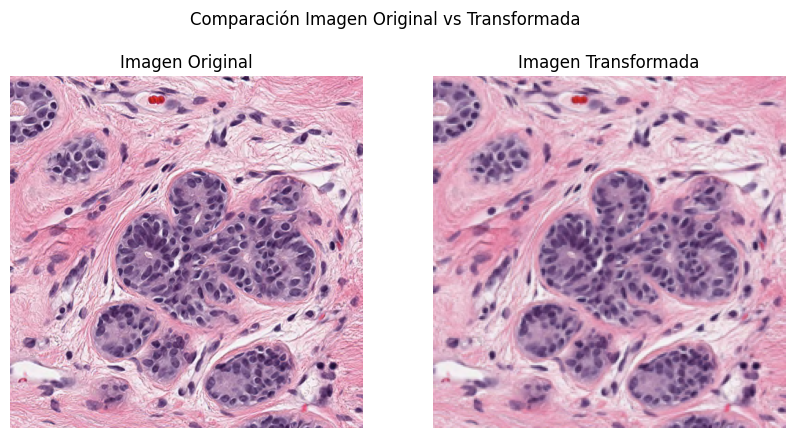

In [37]:
N = 50  # Índice de la imagen que quieres visualizar

# Obtener imagen original (antes de transformaciones)
original_img = train_dataset.images[N].reshape(512, 512, 3).astype(np.uint8)

# Obtener imagen transformada y etiqueta
transformed_img, label = train_dataset[N]

# Convertir tensor a numpy y desnormalizar
transformed_img = transformed_img.numpy().transpose((1, 2, 0))  # De (C, H, W) a (H, W, C)
transformed_img = transformed_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Desnormalizar
transformed_img = np.clip(transformed_img, 0, 1)  # Asegurar valores válidos

# Mostrar ambas imágenes lado a lado
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(original_img)
axs[0].set_title("Imagen Original")
axs[0].axis("off")

axs[1].imshow(transformed_img)
axs[1].set_title("Imagen Transformada")
axs[1].axis("off")

plt.suptitle(f"Comparación Imagen Original vs Transformada")
plt.show()

Reducción de tamaño: La imagen transformada parece haber sido reducida en resolución, lo que es consistente con transforms.Resize((224, 224)). Esto ajusta la imagen original de 512x512 a 224x224 para que sea compatible con modelos preentrenados como ResNet.

Cambio en el contraste o color: La imagen transformada parece ligeramente más apagada o con colores menos saturados. Esto ocurre debido a transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), que ajusta los valores de los píxeles para que tengan una media y desviación estándar similares a las imágenes del dataset ImageNet.

Reorganización de canales: Aunque no se ve visualmente en la comparación, la transformación con transforms.ToTensor() convierte la imagen de formato HWC (Alto, Ancho, Canales) a CHW (Canales, Alto, Ancho), lo cual es necesario para PyTorch.

En general, la transformación está ajustando la imagen para que tenga el formato y la distribución de valores adecuados para la red neuronal.

## *Resnet34*

ResNet-34 es una arquitectura de red neuronal convolucional que consta de 34 capas y se caracteriza por el uso de bloques residuales, lo que permite entrenar redes profundas de manera efectiva. Esta red mitiga el problema de la degradación del rendimiento en redes más profundas y es capaz de aprender funciones complejas para tareas de visión por computadora, como la clasificación de imágenes.

### Definir el Modelo de Resnet34

En esa sección del código, se carga la red preentrenada ResNet-34 y se modifica su última capa para que prediga un solo valor, adaptándola para una tarea de regresión. Además, se asegura que el modelo se ejecute en la GPU, aprovechando así la aceleración en el entrenamiento.

In [38]:
model = modelst.resnet34(weights=True)
model.fc = nn.Linear(512, 1)  # Cambiar capa final para regresión
model = model.to(device)

c:\Users\gabs5\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to C:\Users\gabs5/.cache\torch\hub\checkpoints\resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 45.5MB/s]


### Configuración para Entrenar el Modelo

En esta parte del código, se define la función de pérdida utilizando criterion = nn.MSELoss(), que calcula el error cuadrático medio (MSE) para evaluar la precisión del modelo en una tarea de regresión. Además, se configura el optimizador con optimizer = optim.Adam(model.parameters(), lr=0.0008), que utiliza el algoritmo Adam para actualizar los pesos del modelo durante el entrenamiento, estableciendo una tasa de aprendizaje de 0.0008.

Esta tasa fue encontrada después de probar el modelo distintas veces y variar su tasa, en donde esta fue la que tuvo mejor desempeño con el conjunto de validación.

In [39]:
criterion = nn.MSELoss()  # Pérdida para regresión
optimizer = optim.Adam(model.parameters(), lr=0.0008)

### Entenar el Modelo

Simplemente se entrena el modelo con un conjunto de epochs adecuado, y se calculan las métricas de desempeño del modelo con los datos de entrenamiento y validación.

In [92]:
num_epochs = 15
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_dataloader:
        images, labels = images.to(device), labels.to(device).unsqueeze(1)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    # Validación
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device).unsqueeze(1)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
    
    print(f"Época {epoch+1}/{num_epochs}, Pérdida Entrenamiento: {running_loss/len(train_dataloader):.4f}, Pérdida Validación: {val_loss/len(val_dataloader):.4f}")

print("Entrenamiento finalizado!")


Época 1/15, Pérdida Entrenamiento: 0.1245, Pérdida Validación: 0.0494
Época 2/15, Pérdida Entrenamiento: 0.0273, Pérdida Validación: 0.0527
Época 3/15, Pérdida Entrenamiento: 0.0220, Pérdida Validación: 0.0412
Época 4/15, Pérdida Entrenamiento: 0.0247, Pérdida Validación: 0.0598
Época 5/15, Pérdida Entrenamiento: 0.0171, Pérdida Validación: 0.1042
Época 6/15, Pérdida Entrenamiento: 0.0124, Pérdida Validación: 0.0519
Época 7/15, Pérdida Entrenamiento: 0.0111, Pérdida Validación: 0.0188
Época 8/15, Pérdida Entrenamiento: 0.0081, Pérdida Validación: 0.0704
Época 9/15, Pérdida Entrenamiento: 0.0079, Pérdida Validación: 0.0322
Época 10/15, Pérdida Entrenamiento: 0.0058, Pérdida Validación: 0.0753
Época 11/15, Pérdida Entrenamiento: 0.0050, Pérdida Validación: 0.0365
Época 12/15, Pérdida Entrenamiento: 0.0038, Pérdida Validación: 0.0580
Época 13/15, Pérdida Entrenamiento: 0.0043, Pérdida Validación: 0.0196
Época 14/15, Pérdida Entrenamiento: 0.0046, Pérdida Validación: 0.0273
Época 15/15, Pé

### Probar con Imágenes de Test y Hacer Predicciones

In [ ]:
model.eval()  # Modo evaluación

Predecir

In [55]:
y_pred_Resnet34 = []

with torch.no_grad():
    for images, _ in test_loader:  # No necesitamos las etiquetas
        images = images.to(device)
        outputs = model(images)
        y_pred_Resnet34.extend(outputs.cpu().numpy().flatten())  # Convertir a lista

print("Predicciones:", y_pred_Resnet34[:5])


Predicciones: [1.0297904, 1.2159882, 0.86979485, 1.1448339, 1.146475]


Corregir Posibles Fallos en el modelo en los que se hacen predicciones que se encuentran fuera del Rango de los labels, el cual se encuentra entre 0 y 1

In [56]:
for i in range(len(y_pred_Resnet34)):
    if y_pred_Resnet34[i] < 0:
        y_pred_Resnet34[i] = 0
    if y_pred_Resnet34[i] > 1:
        y_pred_Resnet34[i] = 1

Generar el Archivo de Envío

In [57]:
generar_archivo(test_nombres_imagenes, y_pred_Resnet34, 'resnet34.csv')

## *Resnet50*

 ResNet-50 es una versión más profunda que cuenta con 50 capas y también utiliza conexiones residuales. Su diseño incluye bloques de convolución de 1x1 que mejoran la eficiencia al reducir la dimensionalidad, lo que le permite aprender representaciones más complejas. Debido a su mayor capacidad de modelado, ResNet-50 generalmente ofrece un rendimiento superior en competiciones de clasificación de imágenes en comparación con ResNet-34, lo que conlleva por supuesto a un mayor **requerimiento de recursos computacionales**.

### Definir Modelo

Se define el Modelo de Entrenamiento Resnet50 al igual que cuando se realizó con Resnet34.

La diferencia en los valores de entrada para la capa final entre ResNet-34 y ResNet-50 se debe a la arquitectura de cada modelo: ResNet-34 produce un vector de 512 dimensiones, mientras que ResNet-50 genera un vector de 2048 dimensiones en su capa final. Por lo tanto, al modificar la capa final para ResNet-50, se utiliza nn.Linear(2048, 1) para que coincida con la salida de la red, ya que ResNet-50 tiene más capas y puede extraer características más complejas.

In [59]:
modelr50 = modelst.resnet50(pretrained=True)
modelr50.fc = nn.Linear(2048, 1)  # Cambiar capa final para regresión
modelr50 = modelr50.to(device)

c:\Users\gabs5\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\gabs5\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Configuración de Entrenamiento del Modelo

In [ ]:
criterionr50 = nn.MSELoss()  # Pérdida para regresión
optimizerr50 = optim.Adam(modelr50.parameters(), lr=0.00043)

### Entrenar el Modelo

In [62]:
num_epochs = 10
for epoch in range(num_epochs):
    modelr50.train()
    running_loss = 0.0
    for images, labels in train_dataloader:
        images, labels = images.to(device), labels.to(device).unsqueeze(1)
        
        optimizerr50.zero_grad()
        outputs = modelr50(images)
        loss = criterionr50(outputs, labels)
        loss.backward()
        optimizerr50.step()
        running_loss += loss.item()
    
    # Validación
    modelr50.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device).unsqueeze(1)
            outputs = modelr50(images)
            loss = criterionr50(outputs, labels)
            val_loss += loss.item()
    
    print(f"Época {epoch+1}/{num_epochs}, Pérdida Entrenamiento: {running_loss/len(train_dataloader):.4f}, Pérdida Validación: {val_loss/len(val_dataloader):.4f}")

print("Entrenamiento finalizado!")

Época 1/10, Pérdida Entrenamiento: 0.0200, Pérdida Validación: 0.0746
Época 2/10, Pérdida Entrenamiento: 0.0124, Pérdida Validación: 0.0364
Época 3/10, Pérdida Entrenamiento: 0.0111, Pérdida Validación: 0.0463
Época 4/10, Pérdida Entrenamiento: 0.0086, Pérdida Validación: 0.0645
Época 5/10, Pérdida Entrenamiento: 0.0052, Pérdida Validación: 0.0409
Época 6/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0367
Época 7/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0300
Época 8/10, Pérdida Entrenamiento: 0.0065, Pérdida Validación: 0.0563
Época 9/10, Pérdida Entrenamiento: 0.0073, Pérdida Validación: 0.0172
Época 10/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0216
Entrenamiento finalizado!


### Guardar Predicciones de Train y Validation Para Métricas del Item que sigue

In [63]:
modelr50.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [64]:
y_pred_train_Resnet50 = []
with torch.no_grad():
    for images, _ in train_dataloader:  # No necesitamos las etiquetas
        images = images.to(device)
        outputs = modelr50(images)
        y_pred_train_Resnet50.extend(outputs.cpu().numpy().flatten())  # Convertir a lista

In [65]:
for i in range(len(y_pred_train_Resnet50)):
    if y_pred_train_Resnet50[i] < 0:
        y_pred_train_Resnet50[i] = 0
    if y_pred_train_Resnet50[i] > 1:
        y_pred_train_Resnet50[i] = 1

In [66]:
generar_archivo(train_nombres_imagenes, y_pred_train_Resnet50, 'TrainPredictions2Gabriel.csv')

In [67]:
y_pred_validation_Resnet50 = []
with torch.no_grad():
    for images, _ in val_dataloader:  # No necesitamos las etiquetas
        images = images.to(device)
        outputs = modelr50(images)
        y_pred_validation_Resnet50.extend(outputs.cpu().numpy().flatten())  # Convertir a lista

In [68]:
for i in range(len(y_pred_validation_Resnet50)):
    if y_pred_validation_Resnet50[i] < 0:
        y_pred_validation_Resnet50[i] = 0
    if y_pred_validation_Resnet50[i] > 1:
        y_pred_validation_Resnet50[i] = 1

In [69]:
generar_archivo(validation_nombres_imagenes, y_pred_validation_Resnet50, 'ValidationPredictions.csv')

### Predicciones Conjunto Test

In [70]:
modelr50.eval()  # Modo evaluación

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [71]:
y_pred_Resnet50 = []

with torch.no_grad():
    for images, _ in test_loader:  # No necesitamos las etiquetas
        images = images.to(device)
        outputs = modelr50(images)
        y_pred_Resnet50.extend(outputs.cpu().numpy().flatten())  # Convertir a lista

print("Predicciones:", y_pred_Resnet50[:5])

Predicciones: [0.81442267, 0.96841496, 0.5767719, 0.8432685, 0.98033684]


Corregir Posibles Fallos en el modelo en los que se hacen predicciones que se encuentran fuera del Rango de los labels, el cual se encuentra entre 0 y 1

In [72]:
for i in range(len(y_pred_Resnet50)):
    if y_pred_Resnet50[i] < 0:
        y_pred_Resnet50[i] = 0
    if y_pred_Resnet50[i] > 1:
        y_pred_Resnet50[i] = 1

Generar el Archivo de Envío

In [73]:
generar_archivo(test_nombres_imagenes, y_pred_Resnet50, 'resnet50v2Gabriel.csv')

## *Red Neuronal Convolucional*

**¿Qué es una Red Neuronal Convolucional - CNN?**

Una Red Neuronal Convolucional (CNN) es un tipo de red neuronal diseñada para procesar datos con estructura de cuadrícula, como imágenes. Utiliza capas convolucionales que aplican filtros para extraer características relevantes, como bordes y texturas, reduciendo la dimensionalidad sin perder información importante. Además, incorpora capas de pooling para disminuir la cantidad de parámetros y mejorar la eficiencia. Finalmente, las capas totalmente conectadas procesan las características extraídas para realizar la clasificación o regresión. Las CNN son ampliamente utilizadas en visión por computadora debido a su capacidad para reconocer patrones complejos en imágenes.

Este bloque de código se encarga de preparar las imágenes y sus etiquetas para un modelo de aprendizaje automático que clasifica tumores. Primero, define transformaciones que convierten las imágenes a tensores y las normalizan a un rango específico para mejorar el entrenamiento del modelo. Luego, se implementa una clase personalizada TumorDataset, que carga las imágenes y sus etiquetas desde un directorio específico utilizando un archivo CSV. Esta clase proporciona métodos para acceder a las imágenes y sus etiquetas a través de índices. A continuación, se cargan los datos de entrenamiento y validación desde sus respectivas carpetas y archivos CSV. Finalmente, se crean DataLoaders que permiten cargar los datos en mini-batches durante el entrenamiento, facilitando la manipulación eficiente de los datos en el proceso de entrenamiento del modelo.

Convertimos nuevamente los datos a sus dimensiones originales, para poder manejar la red neuronal convolucional.

- Las dimensiones de las imágenes originales son 512, 512, 3.

In [9]:
# Definir transformaciones (normalización y conversión a tensor)
transform = transforms.Compose([
    transforms.ToTensor(),  # Convierte la imagen a tensor y normaliza a [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización estándar
])

# Clase Dataset personalizada
class TumorDataset(Dataset):
    def __init__(self, folder, labels_df, transform=None):
        self.folder = folder
        self.labels_df = labels_df
        self.transform = transform

    def __len__(self):
        return len(self.labels_df)

    def __getitem__(self, idx):
        row = self.labels_df.iloc[idx]
        image_path = os.path.join(self.folder, f"{int(row['slide'])}_{int(row['rid'])}.tif")
        image = Image.open(image_path)
        
        # Aplicar transformaciones (convertir a tensor y normalizar)
        if self.transform:
            image = self.transform(image)
        
        label = row['y']
        return image, torch.tensor(label, dtype=torch.float32)
    
# Cargar los datos de entrenamiento y validación
train_folder = './breastpathq/datasets/train'
validation_folder = './breastpathq/datasets/validation'

labels_train = pd.read_csv('./breastpathq/datasets/train_labels.csv')
labels_validation = pd.read_csv('./breastpathq-test/val_labels.csv')

# Crear datasets
train_dataset = TumorDataset(train_folder, labels_train, transform=transform)
val_dataset = TumorDataset(validation_folder, labels_validation, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=0, pin_memory=True)

Este código define una clase TestDataset para manejar imágenes de prueba. Carga las imágenes desde una carpeta, aplica transformaciones si están definidas y devuelve cada imagen junto con su nombre de archivo. Luego, crea un DataLoader para iterar sobre el conjunto de prueba en lotes de 16 imágenes sin alterar su orden.

In [10]:
class TestDataset(Dataset):
    def __init__(self, folder, transform=None):
        self.folder = folder
        self.image_names = os.listdir(folder)
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        image_path = os.path.join(self.folder, image_name)
        image = Image.open(image_path)
        
        if self.transform:
            image = self.transform(image)
        
        return image, image_name  # Devuelve la imagen y su nombre

test_folder = './breastpathq-test/test_patches'

# Crear dataset y DataLoader para el conjunto de prueba
test_dataset = TestDataset(test_folder, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0, pin_memory=True)

In [11]:
for images, labels in train_loader:
    print("Forma de las imágenes:", images.shape)  # Debe ser [batch_size, 3, 512, 512]
    print("Forma de las etiquetas:", labels.shape)  # Debe ser [batch_size]
    print("Valores de las etiquetas:", labels)
    break

Forma de las imágenes: torch.Size([16, 3, 512, 512])
Forma de las etiquetas: torch.Size([16])
Valores de las etiquetas: tensor([0.5500, 1.0000, 0.0000, 0.0000, 0.9500, 0.2500, 1.0000, 0.5000, 1.0000,
        0.3000, 0.0000, 0.0000, 0.3000, 0.2500, 1.0000, 0.9000])


### Definición del modelo

Ahora definimos el modelo de la red neuronal, heredando de la clase Module del subpaquete nn de PyTorch

In [ ]:
class TumorCNN(nn.Module):
    def __init__(self):
        super(TumorCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)

        self.fc1 = nn.Linear(128 * 64 * 64, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 1)  # Salida de 1 neurona (probabilidad)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)  # Sin Sigmoid
        return x  # Salida sin Sigmoid


### Entrenamiento del Modelo

Se entrena el modelo de manera similar que con los Modelos Resnet34 y Resnet50

In [ ]:
print(torch.cuda.is_available())  # Debe imprimir True
print(torch.cuda.device_count())  # Debe imprimir >=1
print(torch.cuda.get_device_name(0))  # Nombre de la GPU

# Inicializar modelo, función de pérdida y optimizador
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelCNN = TumorCNN().to(device)

# criterion = nn.BCELoss()  # Binary Cross Entropy para clasificación binaria
criterionCNN = nn.BCEWithLogitsLoss()
optimizerCNN = optim.Adam(model.parameters(), lr=0.001)

# Entrenamiento
num_epochs = 10
for epoch in range(num_epochs):
    modelCNN.train()
    running_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.float().view(-1,1)  # Asegurar que labels tenga shape [batch_size, 1]

        optimizerCNN.zero_grad()
        outputs = modelCNN(images)
        loss = criterionCNN(outputs, labels)
        loss.backward()
        optimizerCNN.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader)}")


True
1
NVIDIA GeForce RTX 4060 Laptop GPU
Epoch 1, Loss: 0.6772522705793381
Epoch 2, Loss: 0.4965636436144511
Epoch 3, Loss: 0.4562129692236582
Epoch 4, Loss: 0.3997337034344673
Epoch 5, Loss: 0.3689047849178314
Epoch 6, Loss: 0.3526375158627828
Epoch 7, Loss: 0.3466759706536929
Epoch 8, Loss: 0.3448138171434402
Epoch 9, Loss: 0.3443968083461126
Epoch 10, Loss: 0.34407151410977044


In [ ]:
predictions=[]

# model.eval()
# with torch.no_grad():
#     for images, _ in test_loader:
#         images = images.to(device)
#         outputs = model(images)  # outputs son logits
#         probabilities = torch.sigmoid(outputs)  # Aplicar sigmoid para obtener probabilidades
#         print("Probabilidades:", probabilities)

# Inicializar lista para guardar las predicciones
predictions = []

modelCNN.eval()
with torch.no_grad():
    for images, _ in test_loader:
        images = images.to(device)
        outputs = modelCNN(images)  # outputs son logits
        probabilities = torch.sigmoid(outputs)  # Aplicar sigmoid para obtener probabilidades
        
        # Convertir las probabilidades a numpy y agregarlas a la lista de predicciones
        predictions.extend(probabilities.cpu().numpy().flatten())

# Convertir la lista de predicciones a un arreglo numpy
predictions = np.array(predictions)

predictions     

## *Modelo Final Seleccionado*

Al evaluar diferentes configuraciones de los modelos que se probaron:
*   ResNet34
*   ResNet50
*   Red Neuronal Convolucional Construida desde 0

Se determinó que el modelo con **mejor desempeño fue ResNet50**, entrenado durante 10 epochs utilizando el optimizador Adam con una tasa de aprendizaje de $0.00045$. Este modelo tuvo una pérdida de aproximadamente 0.02, lo que le permitó destacar con respecto a Resnet34(0.03) y a la Red Neuronal Convolucional Implementada desde 0(0.3)

Esto es esperable, ya que ResNet50 es un modelo más profundo y complejo que ResNet34, lo que le permite capturar mejor las características de las imágenes y reducir el error. Además, su desempeño superior frente a la CNN personalizada tiene sentido, dado que ResNet también es una red convolucional, pero con una arquitectura optimizada y ampliamente validada para este tipo de tareas, lo que facilita su entrenamiento y mejora su capacidad predictiva.

# **Evaluación del desempeño sistemática del modelo final seleccionado**

## **Métricas y PK**

En este proyecto, utilizamos varias métricas para evaluar el rendimiento de nuestro modelo. A continuación, se describen cada una de ellas:

### Métricas de Clasificación

1. **Accuracy (Exactitud)**:
   - La exactitud mide la proporción de predicciones correctas sobre el total de predicciones realizadas.
   - Fórmula: $\text{Accuracy} = \frac{\text{Predicciones Correctas}}{\text{Total de Predicciones}}$

2. **Precision (Precisión)**:
   - La precisión mide la proporción de verdaderos positivos sobre el total de predicciones positivas.
   - Fórmula: $\text{Precision} = \frac{\text{Verdaderos Positivos}}{\text{Verdaderos Positivos} + \text{Falsos Positivos}}$

3. **Recall (Sensibilidad o Recall)**:
   - La sensibilidad mide la proporción de verdaderos positivos sobre el total de positivos reales.
   - Fórmula: $\text{Recall} = \frac{\text{Verdaderos Positivos}}{\text{Verdaderos Positivos} + \text{Falsos Negativos}}$

4. **F1 Score**:
   - El F1 Score es la media armónica de la precisión y la sensibilidad. Es una métrica útil cuando se necesita un balance entre precisión y sensibilidad.
   - Fórmula: $\text{F1 Score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$

5. **Confusion Matrix (Matriz de Confusión)**:
   - La matriz de confusión es una tabla que permite visualizar el rendimiento del modelo de clasificación. Muestra las predicciones correctas e incorrectas.

6. **Classification Report (Reporte de Clasificación)**:
   - El reporte de clasificación proporciona una descripción detallada de las métricas de precisión, sensibilidad y F1 Score para cada clase.

### Métricas de Regresión

1. **Mean Squared Error (MSE) - Error Cuadrático Medio**:
   - El MSE mide el promedio de los errores al cuadrado entre los valores predichos y los valores reales. Penaliza más los errores grandes.
   - Fórmula: $\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$

2. **Mean Absolute Error (MAE) - Error Absoluto Medio**:
   - El MAE mide el promedio de los errores absolutos entre los valores predichos y los valores reales. Es más robusto frente a los outliers.
   - Fórmula: $\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$

Estas métricas nos permiten evaluar de manera integral el rendimiento de nuestro modelo tanto en tareas de clasificación como de regresión. Dado que no contamos ocn los valores `score` de `test`, utilizamos validation para poder calcular cada una de las métricas.



In [74]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

validation_df = pd.read_csv("breastpathq-test/val_labels.csv")

predictions_df = pd.read_csv("Submissions/ValidationPredictions.csv")

true_labels = validation_df["y"]
predicted_labels = predictions_df["score"]

mse = mean_squared_error(true_labels, predicted_labels)
mae = mean_absolute_error(true_labels, predicted_labels)

threshold = 0.5
predicted_labels_binary = (predicted_labels >= threshold).astype(int)
true_labels_binary = (true_labels >= threshold).astype(int)

accuracy = accuracy_score(true_labels_binary, predicted_labels_binary)
precision = precision_score(true_labels_binary, predicted_labels_binary, average="weighted")
recall = recall_score(true_labels_binary, predicted_labels_binary, average="weighted")
f1 = f1_score(true_labels_binary, predicted_labels_binary, average="weighted")
conf_matrix = confusion_matrix(true_labels_binary, predicted_labels_binary)
classification_rep = classification_report(true_labels_binary, predicted_labels_binary)

# Print results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("Matriz de Confusión:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")

Accuracy: 0.8162
Precision: 0.8579
Recall: 0.8162
F1 Score: 0.7979
Matriz de Confusión:
[[116   0]
 [ 34  35]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      1.00      0.87       116
           1       1.00      0.51      0.67        69

    accuracy                           0.82       185
   macro avg       0.89      0.75      0.77       185
weighted avg       0.86      0.82      0.80       185

Mean Squared Error (MSE): 0.0216
Mean Absolute Error (MAE): 0.1085


### *PK*

La métrica **PK** es una medida de precisión que se utiliza para evaluar la concordancia entre las predicciones de un modelo y las etiquetas de validación (ground truth). La métrica PK se calcula utilizando la siguiente fórmula:

$PK = \frac{\left(\frac{P - Q}{P + Q + T}\right) + 1}{2}$

Donde:
- **P**: Número de pares **concordantes** (las predicciones coinciden con las etiquetas).
- **Q**: Número de pares **discordantes** (las predicciones no coinciden con las etiquetas).
- **T**: Número de **empates** (las predicciones y las etiquetas son iguales, relevante en casos de puntuaciones continuas).


In [75]:
def calculate_pk_from_arrays(labels, predictions):
    if len(labels) != len(predictions):
        raise ValueError("Labels and predictions must have the same length.")
    
    # Initialize counts
    P = 0  # Concordant pairs
    Q = 0  # Discordant pairs
    T = 0  # Ties
    
    # Iterate through each pair of labels and predictions
    for label, pred in zip(labels, predictions):
        if label == pred:
            P += 1  # Concordant pair
        else:
            Q += 1  # Discordant pair
    
    # Calculate PK
    if P + Q + T == 0:
        raise ValueError("No valid pairs found to calculate PK.")
    
    pk = (((P - Q) / (P + Q + T)) + 1) / 2
    return pk

def calculate_pk_continuous(labels, predictions, tolerance=1e-5):
    """
    Calculate PK for continuous predictions and labels.

    Parameters:
        labels (np.array): Ground truth labels.
        predictions (np.array): Predicted scores.
        tolerance (float): Threshold to consider predictions and labels equal.

    Returns:
        float: The PK metric value.
    """
    if len(labels) != len(predictions):
        raise ValueError("Labels and predictions must have the same length.")
    
    P = 0  # Concordant pairs
    Q = 0  # Discordant pairs
    T = 0  # Ties
    
    for label, pred in zip(labels, predictions):
        if abs(label - pred) < tolerance:
            T += 1  # Tie
        elif np.sign(label - 0.5) == np.sign(pred - 0.5):  # Concordant
            P += 1
        else:  # Discordant
            Q += 1
    
    if P + Q + T == 0:
        raise ValueError("No valid pairs found to calculate PK.")
    
    pk = (((P - Q) / (P + Q + T)) + 1) / 2
    return pk

print("PK :", calculate_pk_from_arrays(true_labels_binary, predicted_labels_binary))
print("PK Continuous:", calculate_pk_continuous(true_labels, predicted_labels))

PK : 0.8162162162162162
PK Continuous: 0.7945945945945946


# **Conclusiones y Resultados**

## *¿Qué Se Puede Entender de los Datos y las Predicciones?*

El análisis de las predicciones muestra que el modelo ResNet50 con learning rate de 0.00043 y 10 épocas logró reducir la pérdida en validación a 0.0216, lo que indica una mejora en la precisión de sus estimaciones. A lo largo del entrenamiento, la pérdida en el conjunto de entrenamiento disminuyó constantemente, lo que sugiere que el modelo aprendió patrones relevantes en los datos.

Sin embargo, la pérdida en validación presentó algunas fluctuaciones antes de estabilizarse, lo que podría indicar que aún hay margen de mejora en la generalización del modelo. A pesar de esto, el modelo final seleccionado demuestra una buena capacidad predictiva, logrando una relación aceptable entre pérdida en entrenamiento y validación, lo que indica que no está sobreajustado ni subajustado.

Desde una perspectiva de desempeño(realizada con respecto a los datos de validación), el modelo alcanzó una exactitud (accuracy) del $81.62%$, con una precisión del $85.79%$ y un recall del $81.62%$ en, lo que sugiere que el modelo tiene una buena capacidad de predicción en términos generales. Sin embargo, la matriz de confusión muestra que aún se presentan 34 falsos negativos, lo que indica que el modelo podría estar teniendo dificultades para identificar correctamente ciertos casos positivos.

Desde la perspectiva de error, los valores de MSE (0.0216) y MAE (0.1085) reflejan un bajo margen de error en las predicciones, reforzando la estabilidad del modelo.

La métrica PK obtenida en la competencia de las predicciones del conjunto de prueba (Test) fue de $0.923 ± 0.040$, ubicándonos en la posición 49 del leaderboard. Esta puntuación representa una diferencia de $0.018$ con respecto a la mejor predicción de la competencia, lo que indica un desempeño competitivo y un acercamiento significativo a los mejores resultados obtenidos por los participantes.

Para mejorar aún más la exactitud de las predicciones, se podrían probar técnicas como ajustes en los hiperparámetros, aumento de datos (data augmentation), o la aplicación de transformaciones más fuertes a las imágenes que permitirían identificar con mayor precisión la concentración de células cancerígenas. Estas estrategias ayudarían a optimizar la capacidad del modelo para realizar predicciones más precisas y reducir la cantidad de falsos negativos, mejorando su utilidad en entornos clínicos o de diagnóstico asistido por IA.

## *¿Como se Comportó el Modelo?*

Al observar el Comportamiento en las Distinas Épocas del Modelo Seleccionado(Resnet50con Learning Rate de 0.00043 y 10 Épocas):
```
Época 1/10, Pérdida Entrenamiento: 0.0200, Pérdida Validación: 0.0746
Época 2/10, Pérdida Entrenamiento: 0.0124, Pérdida Validación: 0.0364
Época 3/10, Pérdida Entrenamiento: 0.0111, Pérdida Validación: 0.0463
Época 4/10, Pérdida Entrenamiento: 0.0086, Pérdida Validación: 0.0645
Época 5/10, Pérdida Entrenamiento: 0.0052, Pérdida Validación: 0.0409
Época 6/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0367
Época 7/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0300
Época 8/10, Pérdida Entrenamiento: 0.0065, Pérdida Validación: 0.0563
Época 9/10, Pérdida Entrenamiento: 0.0073, Pérdida Validación: 0.0172
Época 10/10, Pérdida Entrenamiento: 0.0041, Pérdida Validación: 0.0216
Entrenamiento finalizado!
```


Es fácil identificar que el modelo fue bajando la pérdida a través de las distintas iteraciones en el conjunto de entrenamiento, lo cual indica que el modelo estaba aprendiendo de manera adecuada en cada una de las iteraciones.

Por otro lado la pérdida en el conjunto de validación comenzó con un valor bastante alto, el cual se redujo de manera considderable en la segunda iteración, pero que creció en las siguientes iteraciomes, manteniéndose en aproximadamente 0.036 hasta la iteración número 8. Pero que finalmente se redujo en la iteración número 10 a 0.0216, lo que hizo que seleccionaramos este como el modelo final.

Utilizando la GPU (Nvidia GeForce GTX 1650), el entrenamiento del modelo tomó aproximadamente 20 minutos, lo que equivale a 2 minutos por época en promedio.

Sin embargo, al ejecutarlo en CPU, el tiempo de entrenamiento se incrementó a 40 minutos en total, el doble del tiempo obtenido con GPU.

Dado esto podemos concluir que: **Aunque la pérdida en entrenamiento disminuyó constantemente, la pérdida en validación tuvo fluctuaciones. Esto podría indicar que el modelo estaba sobreajustando en ciertas épocas, pero logró mejorar en las últimas iteraciones.**

## *¿Qué aspectos se tuvieron en cuenta para mejorar el rendimiento del modelo?* 

Al evaluar los tres modelos desarrollados:

*   ResNet34
*   ResNet50
*   Red Neuronal Convolucional desde cero (CNN)


En primer lugar, se analizó la evolución de la pérdida durante el entrenamiento a lo largo de las épocas. Teóricamente, esta debería disminuir con cada iteración. Si en dos épocas consecutivas la pérdida en entrenamiento no se reducía, sino que aumentaba, se optaba por detener el entrenamiento y ajustar los parámetros del modelo.

Posteriormente, la selección del modelo se basó principalmente en su desempeño con los datos de validación (los cuales no habían sido vistos previamente por el modelo). Se eligió la configuración que obtuvo la menor pérdida y error en este conjunto. Es importante destacar que ninguno de los tres modelos produjo los mejores resultados en el primer intento; fue necesario realizar ajustes en los parámetros para encontrar la configuración más adecuada en términos de pérdida y error en validación.

Los parámetros ajustados durante el proceso, que por supuesto cambiaban su desempeño, fueron:

*   Tasa de aprendizaje (Learning Rate)
*   Número de épocas (Epochs), es decir, iteraciones de entrenamiento
*   Optimizador utilizado

La tasa de aprendizaje nunca cambió drasticamente, se probó con valores que rondaban $1 \times 10^{-4}$

Ya que una tasa de mayor calibre hacía que el modelo se comportara demanera brusca en cada época y que por lo tanto no se entrenara de manera adecuada.

# **Generación del Archivo de Envío**

## *Pantallazo Puntaje e Ubicación en el LeaderBoard*

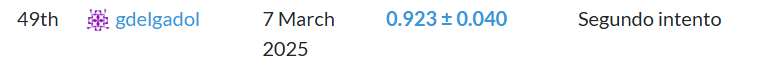

## *Función Utilizada para Generar el Archivo de Envío*

Se hará uso de la siguiente función que se ha definido al inicio del notebook:

```python
def generar_archivo(nombres_imagenes, y_pred, nombre_archivo):
    if not os.path.exists('Submissions'):
        os.makedirs('Submissions')
        
    rutaarchivo = os.path.join('Submissions', nombre_archivo)
    with open(rutaarchivo, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['slide', 'rid', 'score'])
        for nombre, y in zip(nombres_imagenes, y_pred):
            slide, rid = nombre.split('_')
            writer.writerow([slide, rid, y])
```

**Ejemplo de Como Se Debe Usar La Función**

Se le pasan tres parámetros:
*   tes_nombres_imagenes → Arreglo Con los Nombres de los Archivos de las Imágenes que se van a Predecir, el nombre tiene el siguiente formato: slide_rid
*   y_pred → Predicciones obtenidas para cada una de las imágenes(las cuales se encuentran almacenadas en la variable X_test)
*   'submission.csv' → Nombre del Archivo en donde se van a guardar el slide, rid, score de cada imagen

In [33]:
y_pred = []
for y in y_validation:
    y_pred.append(np.random.uniform(0, 1))

In [24]:
generar_archivo(test_nombres_imagenes, predictions, 'submission.csv')

**Funcionamiento del Código**

```python
if not os.path.exists('Submissions'):
    os.makedirs('Submissions')
```
Crea Un Directorio en caso de que no exista, que es en donde se guardarán todos los archivos


```python
rutaarchivo = os.path.join('Submissions', nombre_archivo)
```

Guardamos la ruta del archivo en donde se guardará la información, la ruta del archivo será la unión de la carpeta que se creó anteriormente, con el nombre del archivo especificado en los parámetros de la función:
Submissions/nombre_archivo

```python
with open(rutaarchivo, 'w', newline='') as file:
```
Abre el archivo con el nombre especificado para escritura, el parámetro newline especifica que al agregar una nueva línea se agregue una cadena vacía para evitar agregar nuevas líneas adicionales al escribir en el archivo.

Además se asegura de que se cierre correctamente después de que se complete el bloque de código de su interior.


```python
writer = csv.writer(file)
writer.writerow(['slide', 'rid', 'score'])
```

Crear un objeto writer que es el que permitirá escribir el archivo .csv, el cual se encuentra asociado al archivo file de la línea anterior.

Se escribe una línea en el archivo con los encabezados solicitados por la submission.


```python
for nombre, y in zip(nombres_imagenes, y_pred):
    slide, rid = nombre.split('_')
    writer.writerow([slide, rid, y])
```
*   Iteramos por las dos listas(las cuales tienen el mismo tamaño).

*   Obtenemos el slide y rid al hacer el split('_') del nombre de la imagen(sabiendo que el nombre de la imagen tiene el siguiente formato: slide_rid).

*   Escribimos en el orden correspondiente los datos correspondientes a la imagen(slide, rid, score) en el archivo .csv que se ha utilizado en las anteriores líneas de código
